In [108]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import  Line2D
from matplotlib.path import Path
from matplotlib.patches import FancyArrowPatch
import matplotlib.path as mpltPath
import pandas as pd
import cv2
import pickle
from tqdm import tqdm

In [109]:
animals = ['khorne', 'kratos', 'larsson', 'ninja', 'korra']
data_root = '../../DATA/sinlge_target_experiment_trajs__400_220_1550_965'

if os.path.exists(data_root):
    print(f'{data_root} exists')
else:
    print(f'{data_root} does not exist')
print()

data = pd.DataFrame(columns = ['animal', 'subdir', 'NoFood0-BackFoodE1-BackFoodNE2-OtherFood3-Dirty4', 'condition',
                               'ffmodel', 'fcmodel', 'fcmodel_rlshift_clean'])

def convert_food_code_to_string (code):
    if code == 0:
        return 'No food'
    elif code == 1:
        return 'Food eaten'
    elif code == 2:
        return 'Food not eaten'
    elif code == 3:
        return 'Other food'
    elif code == 4:
        return 'Dirty'
    else:
        return 'Unknown'

ffh5_head = r'*_ff.h5'
fch5_head = '*_fcDLC_resnet50_armsJan17shuffle1_750000.h5'
fch5_rlshift_clean = '*_filtRLSHIFT_fcDLC_resnet50_armsJan17shuffle1_750000.h5'

data_dirs = []
animal_dirs = [os.path.join(data_root, animal) for animal in animals]
for animal_dir in animal_dirs:
    if os.path.exists(animal_dir):
        print(f'{animal_dir} exists')
        ## get all subdirectories and append to data_dirs, don't include files
        subdirs = [os.path.join(animal_dir, subdir) for subdir in os.listdir(animal_dir) if os.path.isdir(os.path.join(animal_dir, subdir))]
        data_dirs.extend(subdirs)

        for subdir in subdirs:
            tmp = pd.read_csv(os.path.join(subdir, 'food_annotation.csv'))
            food_code = tmp['NoFood0-BackFoodE1-BackFoodNE2-OtherFood3-Dirty4'].values

            tmp.insert(0, 'animal', os.path.basename(animal_dir))
            tmp.insert(1, 'subdir', subdir)
            tmp.insert(3, 'condition', [convert_food_code_to_string(code) for code in food_code])

            ## find ff
            h5_file = glob.glob(os.path.join(subdir, ffh5_head))[0]
            df = pd.read_hdf(h5_file)
            tmp.insert(4, 'ffmodel', [df])

            ## find fc
            h5_file = glob.glob(os.path.join(subdir, fch5_head))[0]
            df = pd.read_hdf(h5_file)
            tmp.insert(5, 'fcmodel', [df])

            ## find fc_rlshift_clean
            h5_file = glob.glob(os.path.join(subdir, fch5_rlshift_clean))[0]
            df = pd.read_hdf(h5_file)
            tmp.insert(6, 'fcmodel_rlshift_clean', [df])

            data = pd.concat([data, tmp], ignore_index=True)
    else:
        print(f'{animal_dir} does not exist')
print()

print(f'found {len(data_dirs)} data directories')
print(f'found {len(data)} data entries, shape is {data.shape}')
print()


../../DATA/sinlge_target_experiment_trajs__400_220_1550_965 exists

../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\khorne exists
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\kratos exists
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\larsson exists
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\ninja exists
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\korra exists

found 262 data directories
found 262 data entries, shape is (262, 7)



In [110]:
## print unique animals in data
print(f'unique animals in data: {data.animal.unique()}')

unique animals in data: ['khorne' 'kratos' 'larsson' 'ninja' 'korra']


#### Investigating the quality of the body axis angle predictions of the different models.

There is not a good quantitative measurement for which is best. Both models do well as measured by RMSE during training
and validation. However, the models are trained on different data. The ff model is trained on full frame images while the fcmodel is trained on cropped images.

The best way to compare the models is to look at the predictions on the same data. We can do this by looking at the predictions on the same data.

We are looking for consistancy in the bodyaxis direction predictions of the animals that are in the same condition. We can see this by overlaying the bodyaxis predictions on the same frame.

khorne
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\khorne\0_65-6


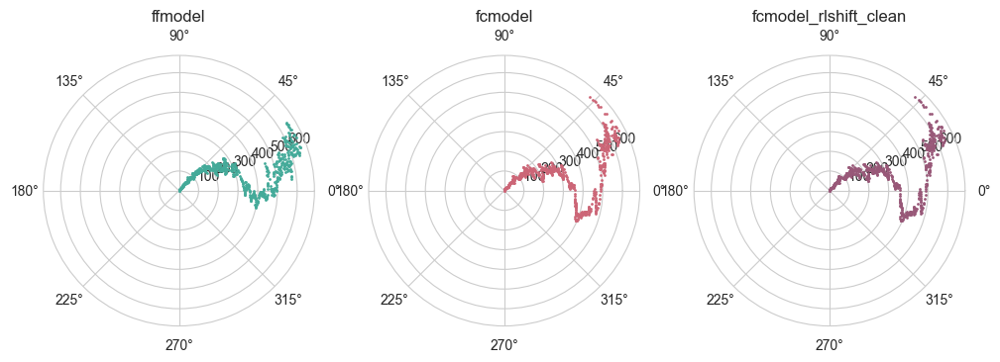

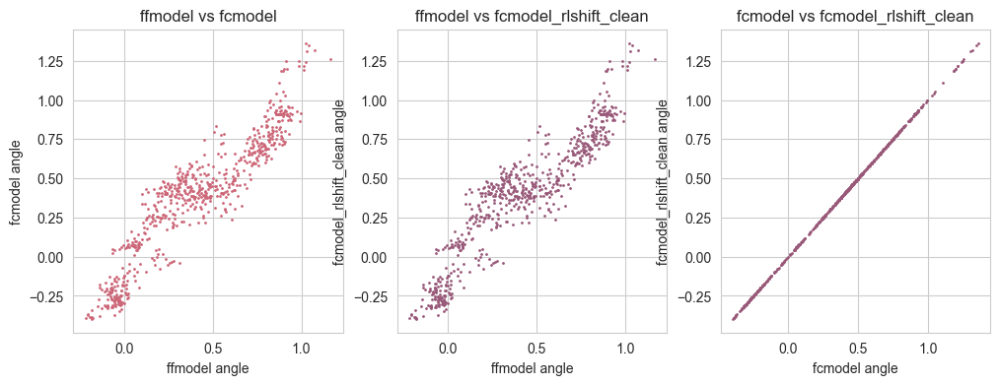

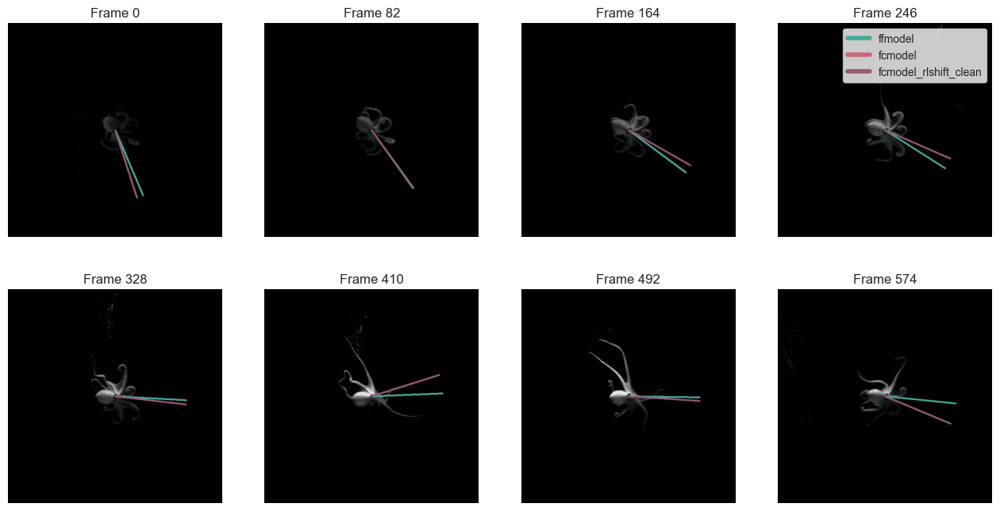

kratos
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\kratos\0_41-1


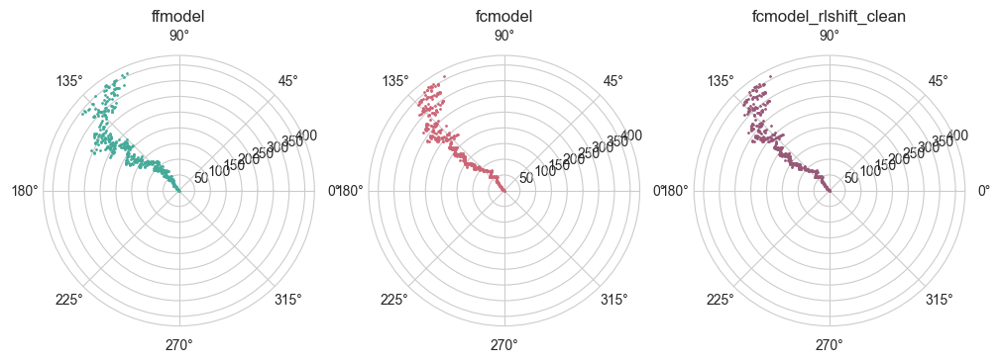

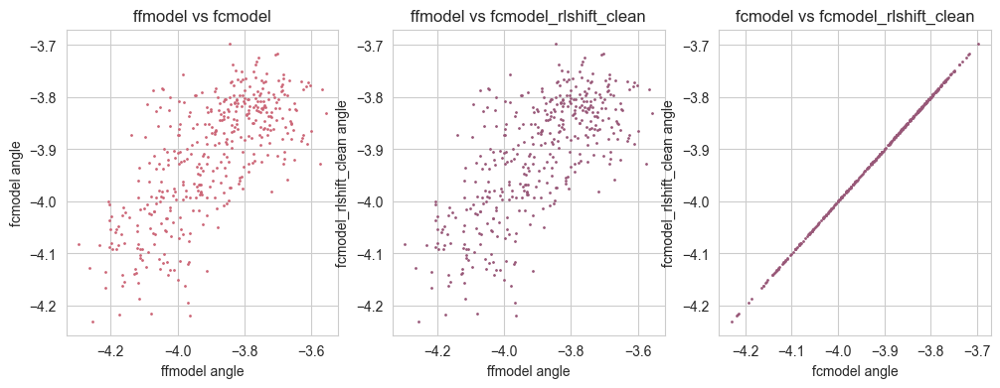

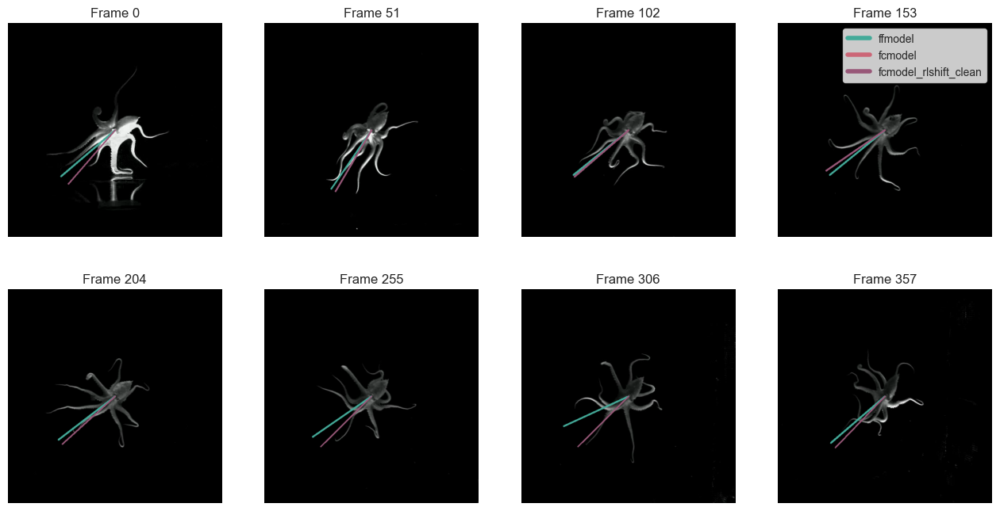

kratos
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\kratos\35_64-6


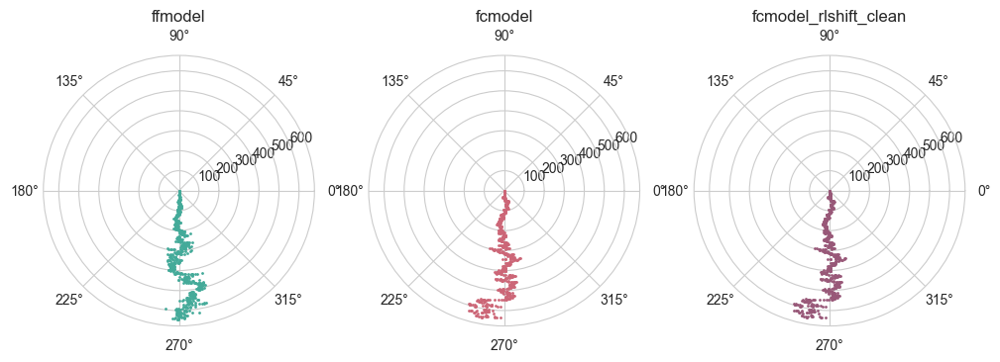

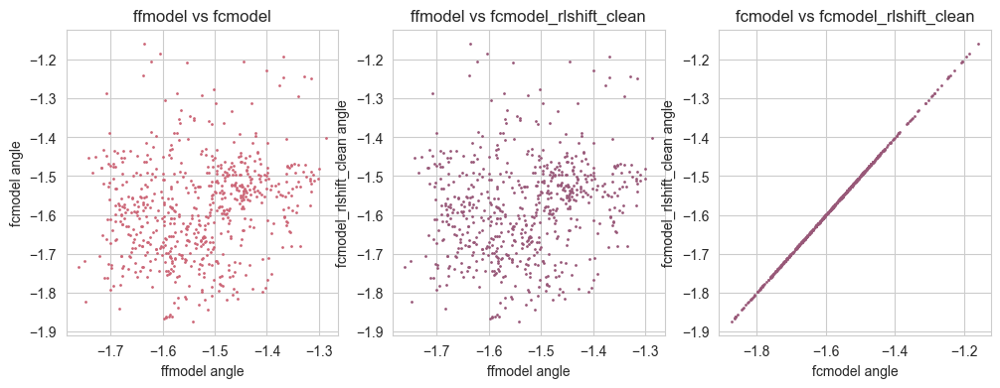

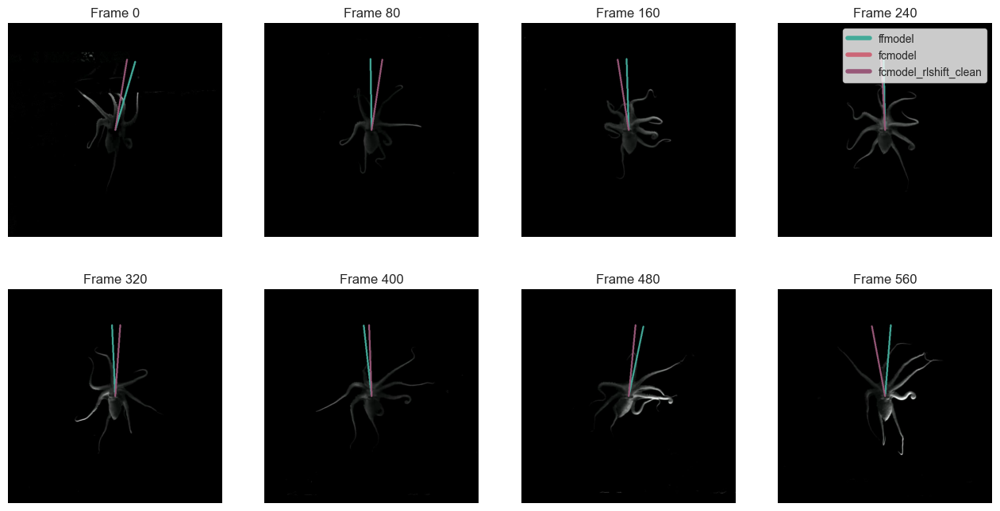

larsson
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\larsson\156_194-0


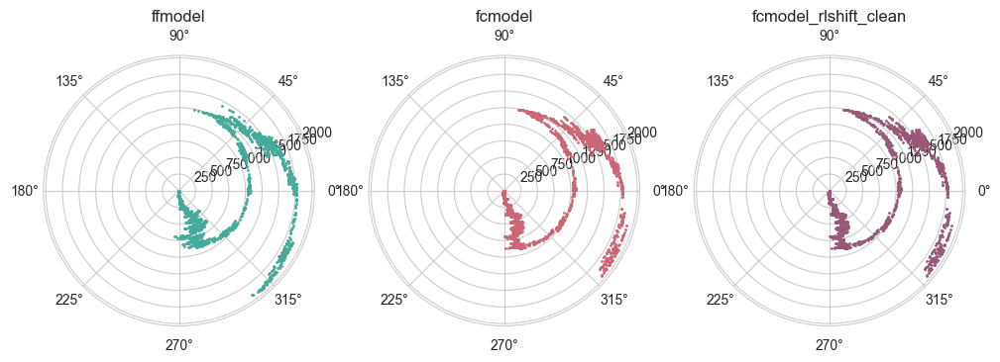

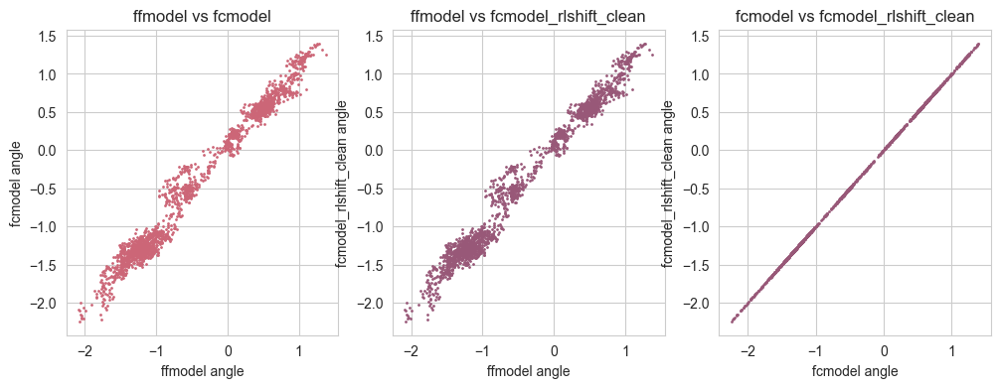

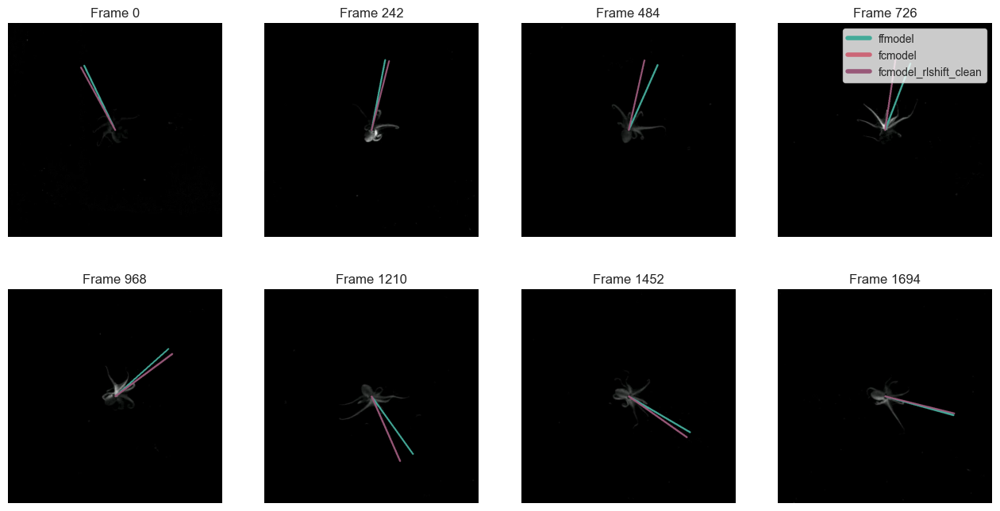

ninja
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\ninja\182_30-9


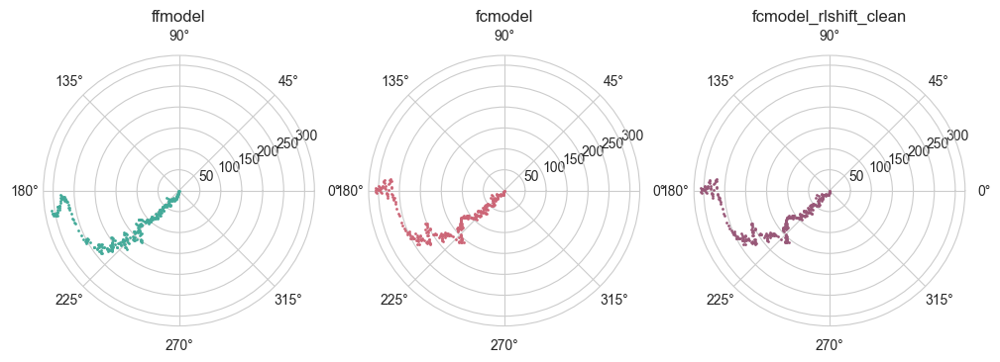

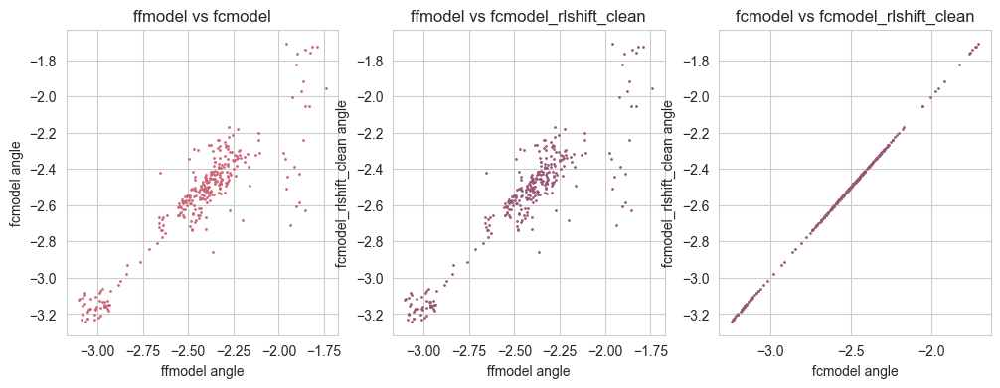

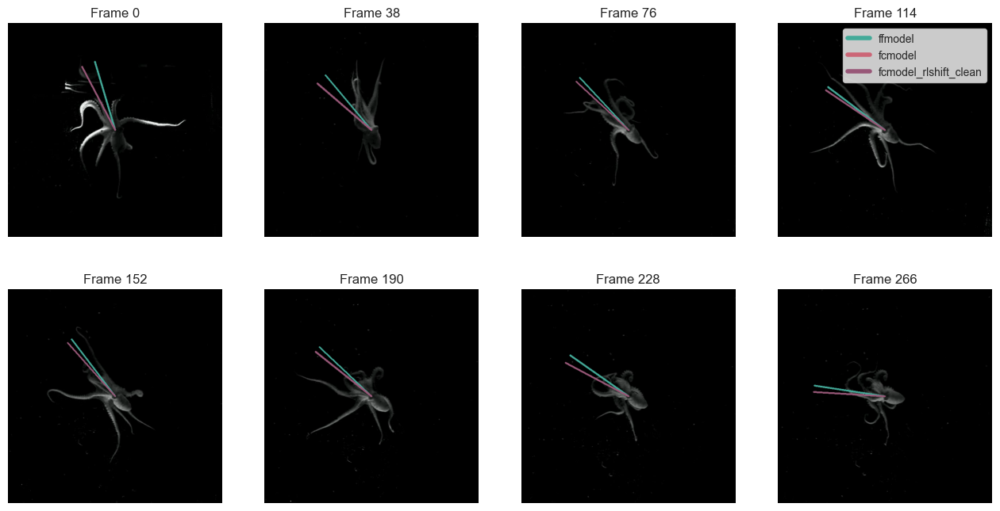

korra
../../DATA/sinlge_target_experiment_trajs__400_220_1550_965\korra\2_25-7


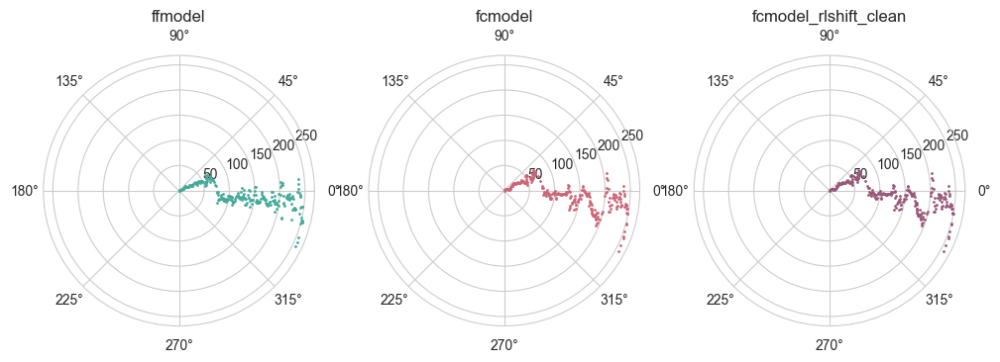

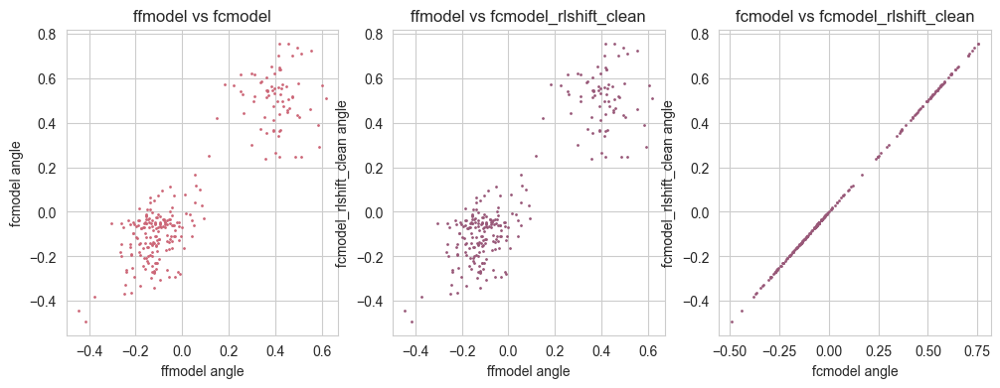

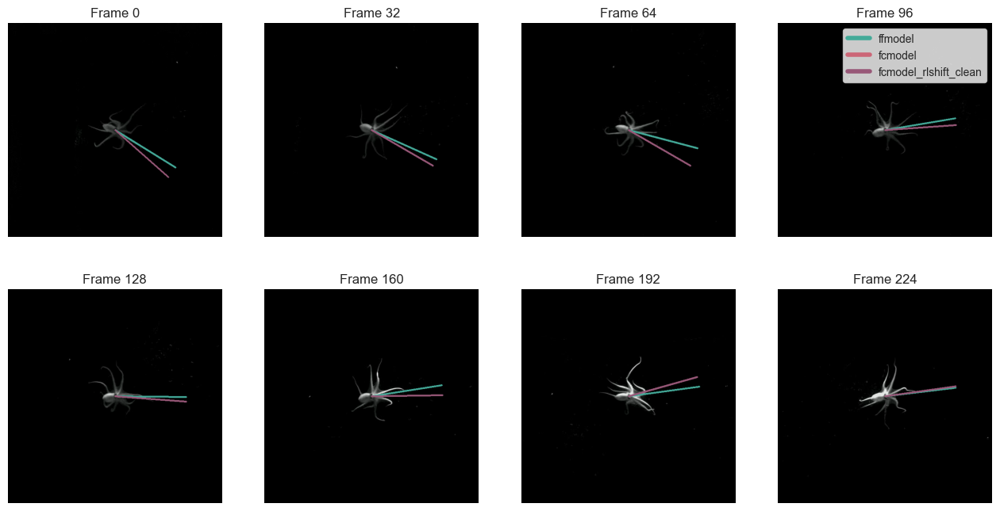

In [111]:
## comparing bodyaxis angle results between the different models

def given_xy_xy_get_bodyaxis_angle(x1, y1, x2, y2):
    '''
    given two points, get the angle of the body axis
    '''
    dx = x2 - x1
    dy = y2 - y1
    angle = np.arctan2(dy, dx)
    angle = angle - np.pi/2

    return np.array(angle)

def hex_to_rgb(value):
    """
    Converts HEX color format to RGB tuple.

    Parameters:
    - value (str): The HEX color string (e.g., '#FFFFFF').

    Returns:
    - tuple: RGB color tuple.
    """
    value = value.lstrip('#')
    length = len(value)
    return tuple(int(value[i:i + length // 3], 16) for i in range(0, length, length // 3))


def draw_body_axis_on_frame(frame, angle, center_coordinates=(300, 300), line_length=200, line_color="#00FF00", line_thickness=3):
    """
    Draws a body axis on the given frame based on the angle and other parameters.

    Parameters:
    - frame (ndarray): The input frame on which the body axis will be drawn.
    - angle (float): The angle of the body axis.
    - center_coordinates (tuple): The center coordinates from where the line will start.
    - line_length (int): The length of the line representing the body axis.
    - line_color (str or tuple): The HEX color or RGB tuple of the line.
    - line_thickness (int): The thickness of the line.

    Returns:
    - ndarray: The frame with the body axis drawn on it.
    """

    # Convert HEX color to RGB tuple if necessary
    if isinstance(line_color, str) and line_color.startswith("#"):
        line_color = hex_to_rgb(line_color)

    center_x, center_y = center_coordinates
    end_x = center_x + line_length * np.cos(angle)
    end_y = center_y + line_length * np.sin(angle)

    # Draw the line on the frame
    cv2.line(frame, (int(center_x), int(center_y)), (int(end_x), int(end_y)), line_color, line_thickness)

    return frame


color_key = {'ffmodel_L': '#332288',
             'ffmodel_R': '#117733',
             'ffmodel_B': '#44AA99',
             'fcmodel_L': '#88CCEE',
             'fcmodel_R': '#DDCC77',
             'fcmodel_B': '#CC6677',
             'fcmodel_rlshift_clean_L': '#AA4499',
             'fcmodel_rlshift_clean_R': '#882255',
             'fcmodel_rlshift_clean_B': '#985878'}

for i, row in data.iloc[::50].iterrows():

    print(row['animal'])
    print(row['subdir'])

    path_video = os.path.join(row['subdir'], 'background_sub_fc_video.mp4')
    ## open video and get frames
    frames = []
    cap = cv2.VideoCapture(path_video)
    while(cap.isOpened()):
        ret, frame = cap.read()
        if ret == True:
            frames.append(frame)
        else:
            break
    cap.release()

    ffmodel = row['ffmodel']
    fcmodel = row['fcmodel']
    fcmodel_rlshift_clean = row['fcmodel_rlshift_clean']

    lex_ff = ffmodel[ffmodel.columns[9]]
    ley_ff = ffmodel[ffmodel.columns[10]]
    rex_ff = ffmodel[ffmodel.columns[12]]
    rey_ff = ffmodel[ffmodel.columns[13]]
    angle_ff = given_xy_xy_get_bodyaxis_angle(lex_ff, ley_ff, rex_ff, rey_ff)

    lex_fc = fcmodel[fcmodel.columns[0]]
    ley_fc = fcmodel[fcmodel.columns[1]]
    rex_fc = fcmodel[fcmodel.columns[3]]
    rey_fc = fcmodel[fcmodel.columns[4]]
    angle_fc = given_xy_xy_get_bodyaxis_angle(lex_fc, ley_fc, rex_fc, rey_fc)

    lex_fc_rlshift_clean = fcmodel_rlshift_clean[fcmodel_rlshift_clean.columns[0]]
    ley_fc_rlshift_clean = fcmodel_rlshift_clean[fcmodel_rlshift_clean.columns[1]]
    rex_fc_rlshift_clean = fcmodel_rlshift_clean[fcmodel_rlshift_clean.columns[3]]
    rey_fc_rlshift_clean = fcmodel_rlshift_clean[fcmodel_rlshift_clean.columns[4]]
    angle_fc_rlshift_clean = given_xy_xy_get_bodyaxis_angle(lex_fc_rlshift_clean, ley_fc_rlshift_clean, rex_fc_rlshift_clean, rey_fc_rlshift_clean)

    ## make 3 polar plots, one for each model type showing the body axis angle as a function of index
    fig, ax = plt.subplots(1, 3, subplot_kw=dict(projection='polar'), figsize=(12, 4))

    ax[0].scatter(angle_ff, np.arange(len(angle_ff)), s=1, c=color_key['ffmodel_B'])
    ax[0].set_title('ffmodel')

    ax[1].scatter(angle_fc, np.arange(len(angle_fc)), s=1, c=color_key['fcmodel_B'])
    ax[1].set_title('fcmodel')

    ax[2].scatter(angle_fc_rlshift_clean, np.arange(len(angle_fc_rlshift_clean)), s=1, c=color_key['fcmodel_rlshift_clean_B'])
    ax[2].set_title('fcmodel_rlshift_clean')

    plt.show(fig)
    plt.close(fig)

    ## show the differences between the angles of the body axis for each model type
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    ax = axs[0]
    ax.scatter(angle_ff, angle_fc, s=1, c=color_key['fcmodel_B'])
    ax.set_title('ffmodel vs fcmodel')
    ax.set_xlabel('ffmodel angle')
    ax.set_ylabel('fcmodel angle')

    ax = axs[1]
    ax.scatter(angle_ff, angle_fc_rlshift_clean, s=1, c=color_key['fcmodel_rlshift_clean_B'])
    ax.set_title('ffmodel vs fcmodel_rlshift_clean')
    ax.set_xlabel('ffmodel angle')
    ax.set_ylabel('fcmodel_rlshift_clean angle')

    ax = axs[2]
    ax.scatter(angle_fc, angle_fc_rlshift_clean, s=1, c=color_key['fcmodel_rlshift_clean_B'])
    ax.set_title('fcmodel vs fcmodel_rlshift_clean')
    ax.set_xlabel('fcmodel angle')
    ax.set_ylabel('fcmodel_rlshift_clean angle')

    plt.show(fig)
    plt.close(fig)

    nrows = 2
    ncols = 4

    fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))

    ## display the frames with the body axis angle plotted on them
    ## for nrows*ncols frame evenly spaced out

    # Calculate the step size for evenly spaced frames
    step = len(frames) // (nrows * ncols)

    # Loop through the frames based on the step size
    for j in range(nrows):
        for u in range(ncols):
            frame_idx = j * ncols + u
            if frame_idx*step < len(frames):
                frame = frames[frame_idx*step].copy()

                frame_with_body_axis = draw_body_axis_on_frame(frame, angle_fc[frame_idx*step], line_color=color_key['fcmodel_B'])
                frame_with_body_axis = draw_body_axis_on_frame(frame_with_body_axis, angle_ff[frame_idx*step], line_color=color_key['ffmodel_B'])
                frame_with_body_axis = draw_body_axis_on_frame(frame_with_body_axis, angle_fc_rlshift_clean[frame_idx*step], line_color=color_key['fcmodel_rlshift_clean_B'])

                # Display the processed frame
                axs[j, u].imshow(frame, cmap='Greys')
                axs[j, u].set_title(f"Frame {frame_idx*step}")
                axs[j, u].axis('off')

    ## add custom legend to axs [0, ncols-1]
    ## place it to the top right of the plot
    axs[0, ncols-1]
    lines = [Line2D([0], [0], color=color_key['ffmodel_B'], lw=4),
             Line2D([0], [0], color=color_key['fcmodel_B'], lw=4),
             Line2D([0], [0], color=color_key['fcmodel_rlshift_clean_B'], lw=4)]
    labels = ['ffmodel', 'fcmodel', 'fcmodel_rlshift_clean']
    axs[0, ncols-1].legend(lines, labels, loc='upper right')

    plt.show(fig)
    plt.close(fig)

### The full frame model (ffmodel) appears to be the best

While the body axis predictions for the fcmodel when plotted in the polar plot appear tighter, the ffmodel looks better when overlaid on the frames. The fcmodel_rlshift_clean is the exact same as the fcmodel.

for this reason we will now drop both of the fcmodels


In [112]:
del data['fcmodel']
del data['fcmodel_rlshift_clean']

Now, we will calculate the velocities and body axis angles using the ffmodel and add them to the data

In [113]:
def given_xy_xy_get_bodyaxis_angle(x1, y1, x2, y2):
    '''
    given two points, get the angle of the body axis
    '''
    dx = x2 - x1
    dy = y2 - y1
    angle = np.arctan2(dy, dx)
    angle = angle - np.pi/2

    return np.array(angle)

mexs = []
meys = []
angles = []
dexs = []
deys = []

for i, row in data.iterrows():

    ffmodel = row['ffmodel']

    lex = ffmodel[ffmodel.columns[9]].values
    ley = ffmodel[ffmodel.columns[10]].values
    rex = ffmodel[ffmodel.columns[12]].values
    rey = ffmodel[ffmodel.columns[13]].values
    angle = given_xy_xy_get_bodyaxis_angle(lex, ley, rex, rey)

    mex = (lex+rex)/2
    mey = (ley+rey)/2

    dx = np.diff(mex)
    dy = np.diff(mey)

    mexs.append(mex[:-1])
    meys.append(mey[:-1])
    angles.append(angle[:-1])
    dexs.append(dx)
    deys.append(dy)

data['mex'] = mexs
data['mey'] = meys
data['angle'] = angles
data['dex'] = dexs
data['dey'] = deys

In [114]:
data

,animal,subdir,NoFood0-BackFoodE1-BackFoodNE2-OtherFood3-Dirty4,condition,ffmodel,mex,mey,angle,dex,dey
0,khorne,../../DATA/sinlge_target_experiment_trajs__400...,0,No food,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[401.0474548339844, 404.4593505859375, 406.060...","[440.537353515625, 440.5512390136719, 440.5607...","[1.1665868304001976, 1.0723524570314256, 1.038...","[3.411895751953125, 1.6014862060546875, 2.1376...","[0.013885498046875, 0.009490966796875, 1.12759..."
1,khorne,../../DATA/sinlge_target_experiment_trajs__400...,1,Food eaten,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[400.1197204589844, 401.25123596191406, 401.92...","[449.23260498046875, 448.79534912109375, 447.8...","[-0.37519907228649085, -0.4375801118300857, -0...","[1.1315155029296875, 0.676300048828125, 0.6567...","[-0.437255859375, -0.971954345703125, -0.60310..."
2,khorne,../../DATA/sinlge_target_experiment_trajs__400...,0,No food,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[401.0016326904297, 405.0762939453125, 407.413...","[818.997802734375, 818.4695434570312, 818.3820...","[-1.1489310949833815, -1.182011160859099, -1.1...","[4.0746612548828125, 2.33673095703125, 3.62585...","[-0.52825927734375, -0.087493896484375, 0.3789..."
3,khorne,../../DATA/sinlge_target_experiment_trajs__400...,0,No food,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[1547.3744506835938, 1541.6861572265625, 1537....","[469.1788330078125, 468.0085144042969, 466.848...","[-1.4731289508895509, -1.5299882359507766, -1....","[-5.68829345703125, -3.75537109375, -5.8099975...","[-1.170318603515625, -1.1601715087890625, -1.2..."
4,khorne,../../DATA/sinlge_target_experiment_trajs__400...,2,Food not eaten,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[868.2198791503906, 868.1780700683594, 869.024...","[220.69500732421875, 222.7007598876953, 224.93...","[-1.2974585360755815, -1.3165373280476356, -1....","[-0.04180908203125, 0.845947265625, 0.36386108...","[2.0057525634765625, 2.2392349243164062, 1.631..."
...,...,...,...,...,...,...,...,...,...,...
257,korra,../../DATA/sinlge_target_experiment_trajs__400...,0,No food,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[400.06044006347656, 401.7640380859375, 402.27...","[832.73583984375, 831.1421813964844, 828.79968...","[-3.1676017042881988, -3.277472235584458, -3.2...","[1.7035980224609375, 0.507843017578125, 0.0733...","[-1.593658447265625, -2.342498779296875, -2.32..."
258,korra,../../DATA/sinlge_target_experiment_trajs__400...,2,Food not eaten,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[401.1575927734375, 404.2585144042969, 407.873...","[576.7537231445312, 576.9815368652344, 578.237...","[-1.9783773909699944, -1.9769077606047918, -2....","[3.100921630859375, 3.615447998046875, 3.70758...","[0.227813720703125, 1.255950927734375, 0.02526..."
259,korra,../../DATA/sinlge_target_experiment_trajs__400...,0,No food,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[747.704833984375, 747.683837890625, 746.92684...","[221.6353988647461, 224.21823120117188, 228.25...","[-1.9815063760442833, -2.0723556911491836, -1....","[-0.02099609375, -0.756988525390625, 0.1355895...","[2.5828323364257812, 4.032737731933594, 4.1099..."
260,korra,../../DATA/sinlge_target_experiment_trajs__400...,0,No food,scorer crop-x crop-y crop-xr crop-yr \ bod...,"[674.712158203125, 674.5656127929688, 675.0578...","[964.9907531738281, 964.6494445800781, 963.761...","[-0.821458679652425, -0.7903982450576514, -0.8...","[-0.14654541015625, 0.492279052734375, -0.3243...","[-0.34130859375, -0.88800048828125, -0.4104309..."


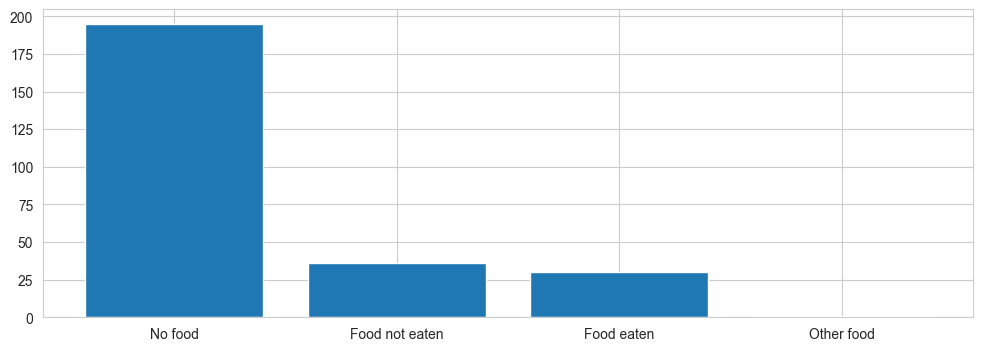

In [115]:
## make bar plot of condition counts
fig, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.bar(np.arange(len(data['condition'].value_counts())), data['condition'].value_counts().values)

ax.set_xticks(np.arange(len(data['condition'].value_counts())))
ax.set_xticklabels(data['condition'].value_counts().index)

plt.show(fig)
plt.close(fig)

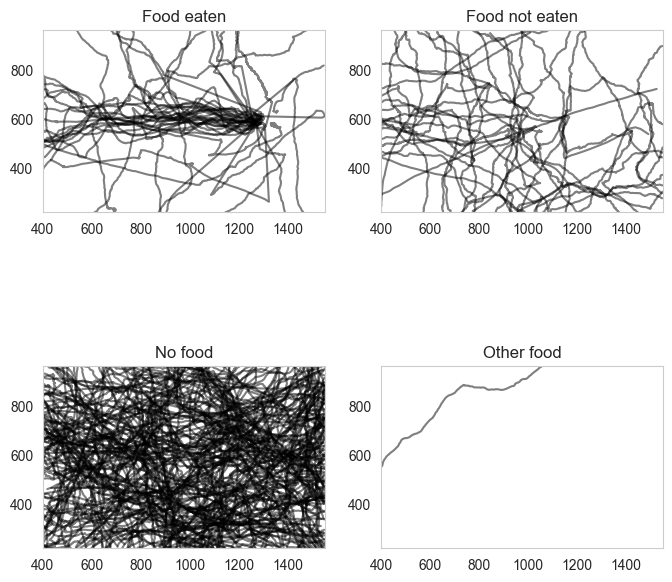

In [116]:
## make 2x2 plot for each condition plotting mex, mey

xlim = (400, 1550)
ylim = (220, 965)

nrows = 2
ncols = 2

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))

for i, condition in enumerate(sorted(data['condition'].unique())):
    ax = axs[i//ncols, i%ncols]

    ax.grid(color='white')

    for j, row in data[data['condition'] == condition].iterrows():
        mex = row['mex']
        mey = row['mey']

        ax.plot(mex, mey, color='black', alpha=0.5)

    ax.set_title(condition)
    ax.set_aspect('equal')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

In [117]:
path_plume_video = '../../DATA/1T/plume_bgsub_nozzleheight_1in_100ke_30g_10fps_01.mp4'

video = cv2.VideoCapture(path_plume_video)

frames = []
while True:
    ret, frame = video.read()
    if ret:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        frames.append(frame)
    else:
        break
frames = np.array(frames[700:])

video.release()

In [118]:
frames.shape, frames.dtype, frames.min(), frames.max()

((1100, 1200, 1920), dtype('uint8'), 0, 255)

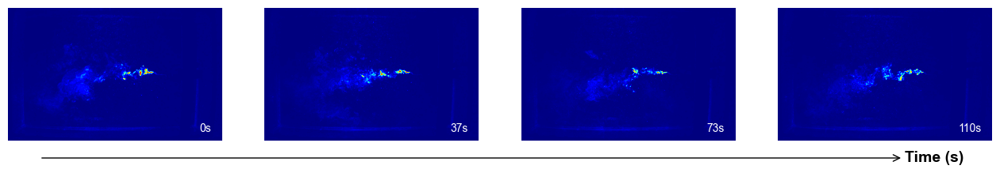

In [119]:
## make a 1x9 plot of the plume frames evenly spaced out by index

nrows = 1
ncols = 4

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*4, nrows*4))

for i, frame_idx in enumerate(np.linspace(0, len(frames)-1, ncols).astype(int)):
    ax = axs[i]

    frame = frames[frame_idx].copy()

    ax.imshow(frame, cmap='jet')
    ## add frame number as text to bottom right corner of image
    ax.text(0.95, 0.05, f'{round(frame_idx/10)}s', transform=ax.transAxes, color='white', ha='right', va='bottom')

    ax.axis('off')

# Create an arrow
arrow_start = (0.15, 0.25)
arrow_end = (0.83, 0.25)
arrow = FancyArrowPatch(arrow_start, arrow_end, mutation_scale=15,
                        arrowstyle='->', color='black', transform=fig.transFigure, clip_on=False)

# Add arrow to the figure
fig.patches.append(arrow)

# Add 't' text at the end of the arrow
fig.text(arrow_end[0] + 0.001, arrow_end[1], 'Time (s)', ha='left', va='center', transform=fig.transFigure, fontsize=14, color='black', weight='bold')

# Adjust the bottom margin to make space for the arrow
fig.subplots_adjust(bottom=0.15)

plt.show()

In [120]:
frames_std = np.std(frames[::], axis=0)
vmax = np.mean(frames_std) + 8*np.std(frames_std)

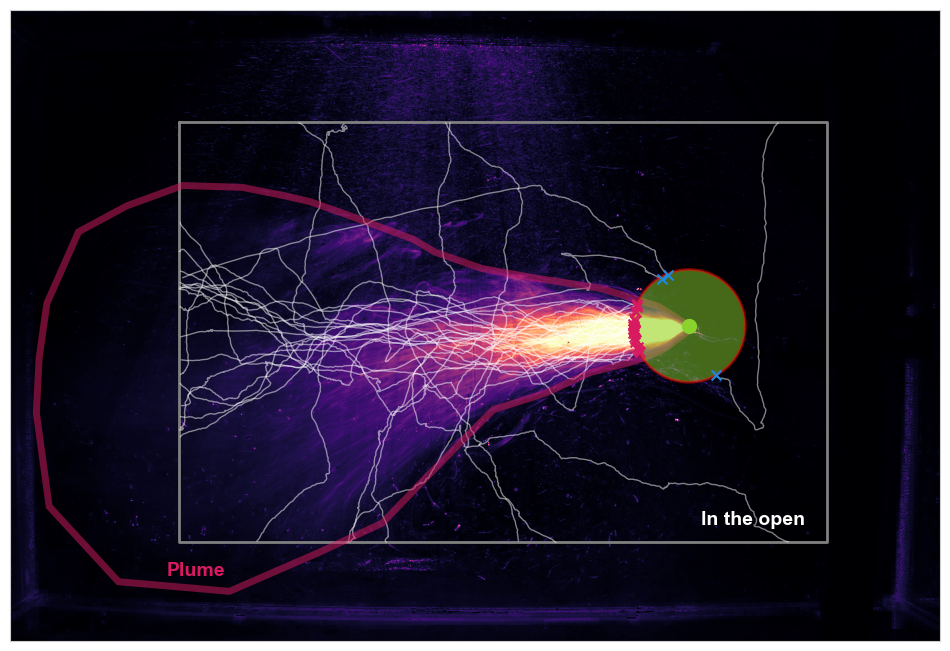

In [121]:
def find_crossing_index(mex, mey, plume_vertices, food_location, food_radius):
    """
    Find the index where mex, mey cross into the food_circle.

    Parameters:
    - mex, mey: Arrays of x and y coordinates
    - plume_vertices: Vertices defining the plume_polygon
    - food_location: (x, y) location of the food

    Returns:
    - index: Index of the crossing point in the mex, mey arrays. Returns None if no crossing found.
    - in_plume: Boolean indicating if the crossing point is in the plume. Returns None if no crossing found.
    """
    for idx, (x, y) in enumerate(zip(mex, mey)):
        dist_to_center = (x - food_location[0])**2 + (y - food_location[1])**2
        if dist_to_center < food_radius**2:
            path = Path(plume_vertices)
            in_plume = path.contains_point((x, y))
            return idx, in_plume

    return None, None

crossing_color_key = {'in_plume': '#D81B60', 'out_plume': '#1E88E5', 'food_circle': '#8AD22D'}

path_plume_polygon = '../../DATA/1T/plume_polygon.csv'

dat_polygon = pd.read_csv(path_plume_polygon)

x_verts = np.array(dat_polygon['axis-1'].tolist())
y_verts = np.array(dat_polygon['axis-0'].tolist())

xlim = (400, 1550)
ylim = (220, 965)

plume_vertices = np.stack([x_verts, y_verts], axis=1)

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.imshow(frames_std, cmap='magma', zorder=1, vmax=vmax)

poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
ax.add_patch(poly)

idx_highest = np.argmax(plume_vertices[:, 1])
ax.text(plume_vertices[idx_highest, 0]-60, plume_vertices[idx_highest, 1]-20, 'Plume', color='#D81B60', ha='center', va='bottom', fontsize=14, weight='bold')

ax.plot([xlim[0], xlim[1], xlim[1], xlim[0], xlim[0]], [ylim[0], ylim[0], ylim[1], ylim[1], ylim[0]], color='grey', linewidth=2, zorder=2)
## add text to the bottom right of the plotted rectangle
ax.text(xlim[1]-40, ylim[1]-25, 'In the open', color='white', ha='right', va='bottom', fontsize=14, weight='bold')

ax.grid(color='white')
ax.set_aspect('equal')

ax.set_xticks([])
ax.set_yticks([])

## find the coordinates of the furthest right vertice of the polygon
idx_right = np.argmax(plume_vertices[:, 0])
food_location = (plume_vertices[idx_right, 0], plume_vertices[idx_right, 1])

food_radius = 100
food_circle = plt.Circle(food_location, food_radius, facecolor=crossing_color_key['food_circle'], alpha=0.5, zorder=3, edgecolor='red', linewidth=2)
ax.add_patch(food_circle)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=100, zorder=3)

ax.set_xlim(xlim[0]-300, xlim[1]+200)
ax.set_ylim(ylim[1]+175, ylim[0]-200)

## subsample gframes
gss = 40 ## 1 picture every 4 seconds

## plot all of the food eaten trajectories
ghost_plots = []
gmexs = []
gmeys = []
gframe_idxs = []
for i, row in data[data['condition'] == 'Food eaten'].iterrows():
    mex_values = np.array(row['mex'])
    mey_values = np.array(row['mey'])

    idx, in_plume = find_crossing_index(mex_values, mey_values, plume_vertices, food_location, food_radius)

    if idx is not None:  # If a crossing point is found
        if in_plume:
            ax.scatter(mex_values[idx], mey_values[idx], color=crossing_color_key['in_plume'], marker='x', s=50, zorder=3)
        else:
            ax.scatter(mex_values[idx], mey_values[idx], color=crossing_color_key['out_plume'], marker='x', s=50, zorder=3)

    ax.plot(mex_values[:idx], mey_values[:idx], color='white', linewidth=1, alpha=0.5, zorder=2)

    ## get the video path
    if in_plume == True:
        subdir = row['subdir']
        video_path = glob.glob(os.path.join(subdir, '*_ff.mp4'))[0]

        cap = cv2.VideoCapture(video_path)

        gframes = []
        gidxs = []
        for i in range(0, idx, gss):
            cap.set(cv2.CAP_PROP_POS_FRAMES, i)
            ret, frame = cap.read()
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            gframes.append(frame)
            gidxs.append(i)
        cap.release()
        gframes = np.array(gframes)
        gmexs.append(mex_values[:idx])
        gmeys.append(mey_values[:idx])
        gframe_idxs.append(gidxs)

        gstd = np.std(gframes, axis=0)
        ghost_plots.append(gstd)

plt.show(fig)
plt.close(fig)

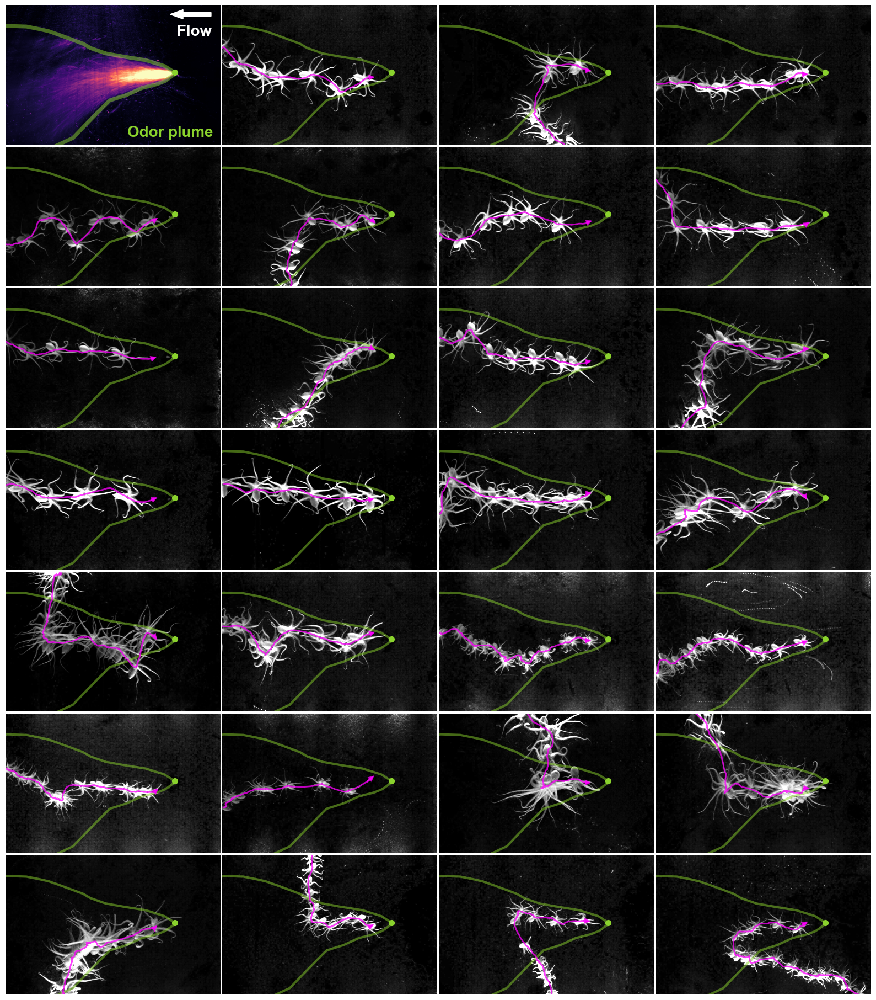

In [122]:
## plot the ghost plots as a 4x8 grid

xlim = (400, 1550)
ylim = (965, 220)

fig, axs = plt.subplots(7, 4, figsize=(16,20))

ax = axs.flatten()[0]
ax.imshow(frames_std, cmap='magma', zorder=1, vmax=vmax)
poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor=crossing_color_key['food_circle'], linewidth=5, alpha=0.5, zorder=3)
ax.add_patch(poly)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=50, zorder=3)
## add text to the bottom right of the plotted rectangle
ax.text(xlim[1]-40, ylim[0]-25, 'Odor plume', color=crossing_color_key['food_circle'], ha='right', va='bottom', fontsize=20, weight='bold')
## add arrow in top right of the plotted rectangle pointing from right to left
ax.arrow(xlim[1]-50, ylim[1]+50, -150, 0, color='white', width=20, head_width=50, head_length=70, zorder=4)
## add text beneath the arrow
ax.text(xlim[1]-140, ylim[1]+180, 'Flow', color='white', ha='center', va='bottom', fontsize=20, weight='bold')

i = 1
for gstd in ghost_plots:
    ax = axs[i//4, i%4]

    vmax = np.mean(gstd) + 7*np.std(gstd)

    ax.imshow(gstd, cmap='Greys_r', zorder=1, vmax=vmax)

    ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=50, zorder=4)

    poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor=crossing_color_key['food_circle'], linewidth=3, alpha=0.5, zorder=3)
    ax.add_patch(poly)

    mex = gmexs[i-1]
    mey = gmeys[i-1]
    ax.plot(mex, mey, color='magenta', linewidth=2, alpha=0.75, zorder=5)
    ## add arrow to the end of the trajectory
    ax.arrow(mex[-5], mey[-5], mex[-1]-mex[-5], mey[-1]-mey[-5], color='magenta', linewidth=2, alpha=0.75, zorder=5, head_width=20, head_length=20, length_includes_head=True)

    i += 1

for ax in axs.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.set_aspect('equal')

    ax.grid(color='white')
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)

fig.tight_layout(h_pad=-11.5, w_pad=0.25)

fig_name = '1t-approaches_ghost_plots.png'
path_fig = os.path.join('../../DATA/1T', fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

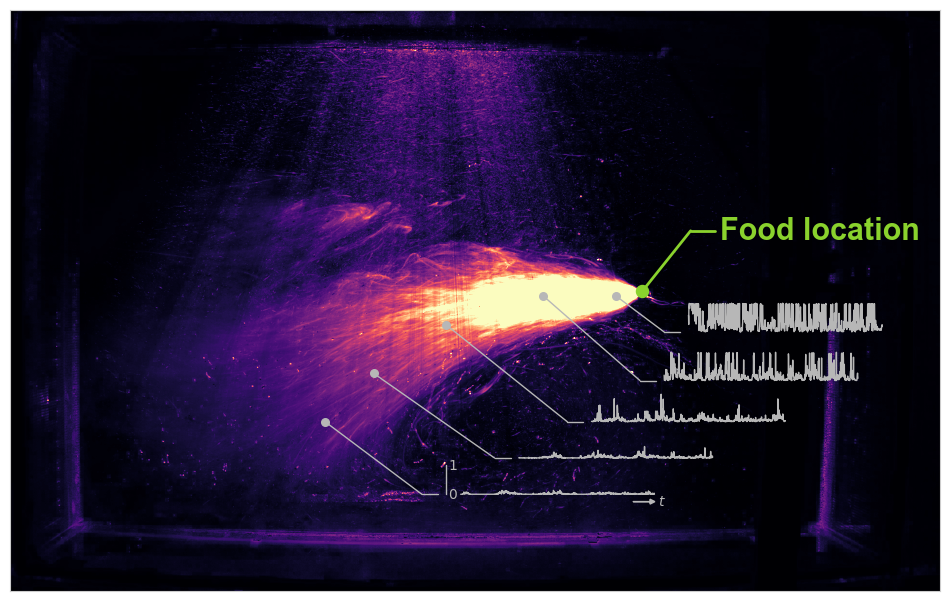

In [123]:

plume_color_key = {
    'data': '#B7B7B7',
}

## show plot of frames_std=
sample_positions = [(1100, 590) , (900, 650), (750, 750) , (1250, 590), (650, 850)]

plot_offsets = [(150, 175) , (200, 200), (200, 175),  (50, 75),(150, 150)]

## for each position get all the pixel values for that pixel in frames across time
sample_values = []
for x, y in sample_positions:
    values = frames[:, y, x]
    ## normalize values using values/255
    values = values/255
    sample_values.append(np.array(values))

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.imshow(frames_std, cmap='magma', vmin=0, vmax=vmax, zorder=1)

food_loc_offset = (100, -125)
ax.scatter(food_location[0], food_location[1], color=crossing_color_key['food_circle'], marker='o', s=75, zorder=4)
locfxs = food_location[0]+food_loc_offset[0]
locfys = food_location[1]+food_loc_offset[1]
ax.plot([food_location[0], locfxs], [food_location[1], locfys], color=crossing_color_key['food_circle'], linewidth=2, zorder=4)
ax.plot([locfxs, locfxs+50], [locfys, locfys], color=crossing_color_key['food_circle'], linewidth=2, zorder=4)
ax.text(locfxs+60, locfys, 'Food location', color=crossing_color_key['food_circle'], ha='left', va='center', fontsize=22, weight='bold')

## show sample positions with values plotted coming out of it to the right
length_values = 400
xoffset = 50
y_scalar = 60
x_shift = 50
for i, (x, y) in enumerate(sample_positions):
    ax.scatter(x, y, color=plume_color_key['data'], s=30, zorder=2)

    ## make array of x values from 0 to 100 with number of values equal to length_values
    values = sample_values[i]
    x_values = np.linspace(0, length_values, len(values))
    x_values = x_values + x + x_shift
    y_values = -values * y_scalar + y

    offsets = plot_offsets[i]

    ax.plot([x, x_values[0]+offsets[0]], [y, max(y_values)+offsets[1]], color=plume_color_key['data'], linewidth=1, zorder=2)

    ax.plot([x_values[0]+offsets[0], (2/3)*xoffset + x_values[0]+offsets[0]], [max(y_values)+offsets[1],max(y_values)+offsets[1]], color=plume_color_key['data'], linewidth=1, zorder=2)

    if i == 4:
        ## at inset axis to the plotted data
        ax.plot(x_values+offsets[0]+xoffset+30, y_values+offsets[1], color=plume_color_key['data'], linewidth=1, zorder=2)
        ax.plot([x_values[0]+offsets[0]+xoffset, x_values[0]+offsets[0]+xoffset], [max(y_values)+offsets[1], max(y_values)+offsets[1]-y_scalar], color=plume_color_key['data'], linewidth=1, zorder=2)
        ax.text(x_values[0]+offsets[0]+xoffset+13, max(y_values)+offsets[1]-y_scalar, '$\\it{1}$', color=plume_color_key['data'], fontsize=10, weight='bold', ha='center', va='center', zorder=2)
        ax.text(x_values[0]+offsets[0]+xoffset+13, max(y_values)+offsets[1], '$\\it{0}$', color=plume_color_key['data'], fontsize=10, weight='bold', ha='center', va='center', zorder=2)
        ax.arrow(x_values[-40]+offsets[0]+xoffset, max(y_values)+offsets[1]+15, 35, 0, color=plume_color_key['data'], linewidth=1, head_width=10, head_length=10, zorder=2)
        ## add text t at end of arrow
        ax.text(x_values[-40]+offsets[0]+xoffset+60, max(y_values)+offsets[1]+15, '$\\it{t}$', color=plume_color_key['data'], fontsize=10, weight='bold', ha='center', va='center', zorder=2)
    else:
        ax.plot(x_values+offsets[0]+xoffset, y_values+offsets[1], color=plume_color_key['data'], linewidth=1, zorder=2)

    ## plot text of sample position and index
    #ax.text(x+10, y+10, f'{i}', color='blue', fontsize=14, weight='bold', ha='center', va='center', zorder=2)

ax.set_xticks([])
ax.set_yticks([])

fig_name = '1t-approaches_plume_dynamics.png'
path_fig = os.path.join('../../DATA/1T', fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

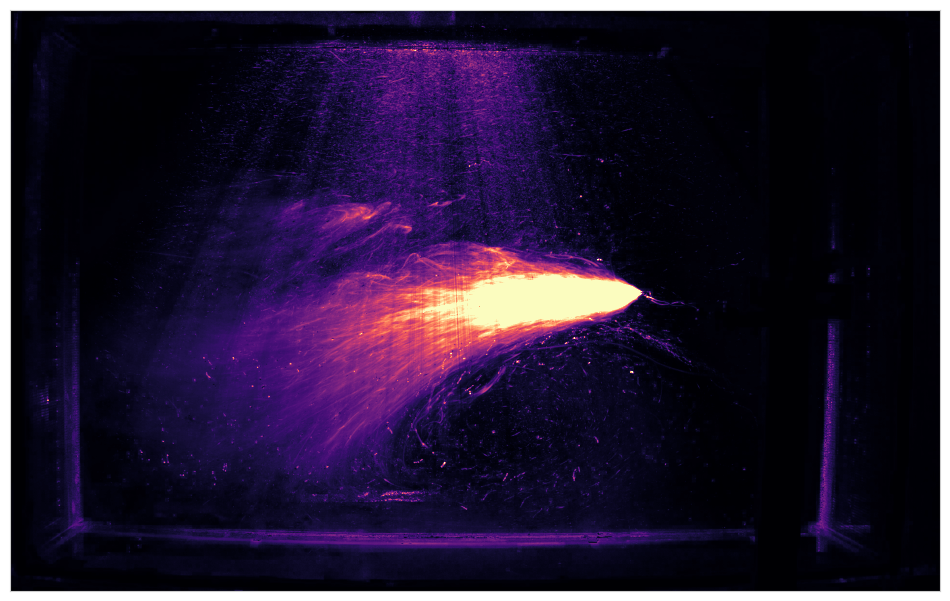

In [124]:
## just plot the frames_std

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.imshow(frames_std, cmap='magma', vmin=0, vmax=vmax, zorder=1)

ax.set_xticks([])
ax.set_yticks([])

fig_name = '1t-approaches_plume_dynamics_frames_std.png'
path_fig = os.path.join('../../DATA/1T', fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

In [125]:
sorted(data['condition'].unique())

['Food eaten', 'Food not eaten', 'No food', 'Other food']

In [126]:
data = data[data['condition'] != 'Other food']

In [127]:
data.columns

Index(['animal', 'subdir', 'NoFood0-BackFoodE1-BackFoodNE2-OtherFood3-Dirty4',
       'condition', 'ffmodel', 'mex', 'mey', 'angle', 'dex', 'dey'],
      dtype='object')

In [128]:
## test if mex, mey in plume polygon

insides = []
for i, row in data.iterrows():
    mex = row['mex']
    mey = row['mey']

    path = mpltPath.Path(plume_vertices)
    inside = path.contains_points(np.stack([mex, mey], axis=1))
    insides.append(inside)

data.insert(0, 'inside_plume', insides)

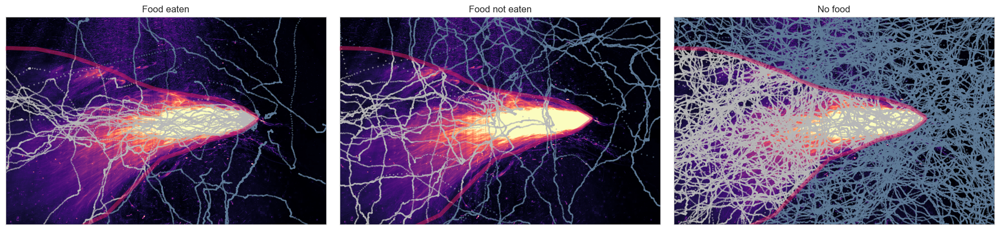

In [129]:
## make 2x2 plot for each condition plotting mex, mey

inside_plume_color_key = {True: '#B7B7B7', False: '#607C98'}

xlim = (400, 1550)
ylim = (965, 220)

nrows = 1
ncols = 3

fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*6 , nrows*4))

for i, condition in enumerate(sorted(data['condition'].unique())):
    ax = axs.flatten()[i]

    ax.grid(color='white')

    ax.imshow(frames_std, cmap='magma', vmin=0, vmax=vmax, zorder=1)

    poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
    ax.add_patch(poly)


    for j, row in data[data['condition'] == condition].iterrows():
        mex = row['mex']
        mey = row['mey']

        insides = row['inside_plume']
        ## insides is a list the same length as mex, mey like [True, False, True, ...]
        ## color the points inside the plume green and outside red
        c = [inside_plume_color_key[inside] for inside in insides]

        ax.scatter(mex, mey, s=1, c=c, zorder=2, alpha=0.5)


    ax.set_title(condition)
    ax.set_aspect('equal')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()

plt.show(fig)
plt.close(fig)

In [130]:
data.columns

Index(['inside_plume', 'animal', 'subdir',
       'NoFood0-BackFoodE1-BackFoodNE2-OtherFood3-Dirty4', 'condition',
       'ffmodel', 'mex', 'mey', 'angle', 'dex', 'dey'],
      dtype='object')

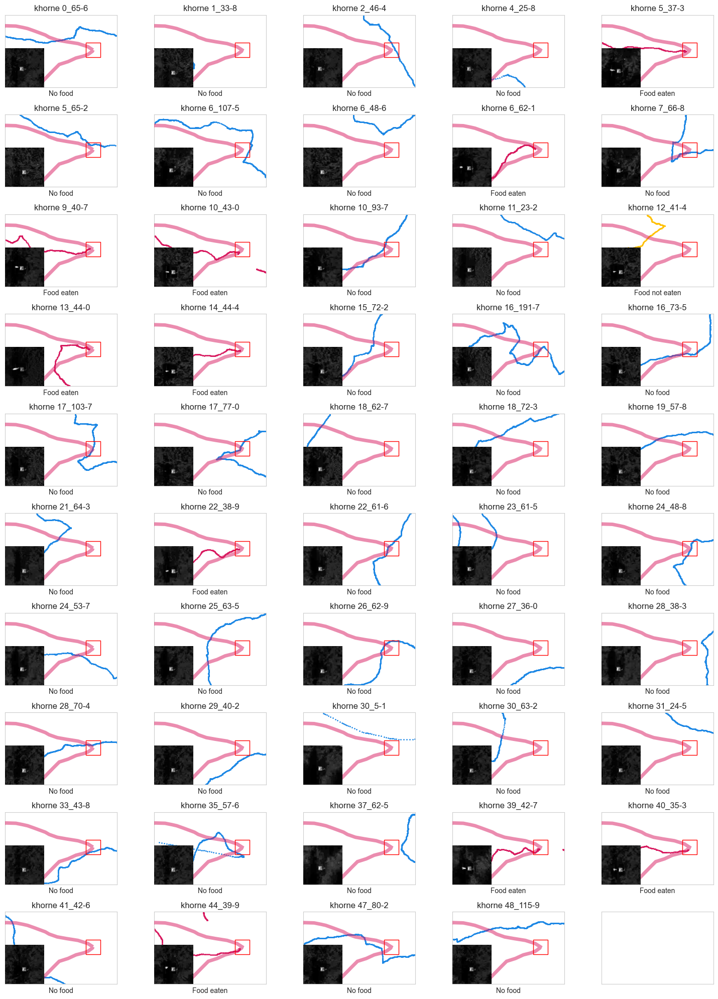

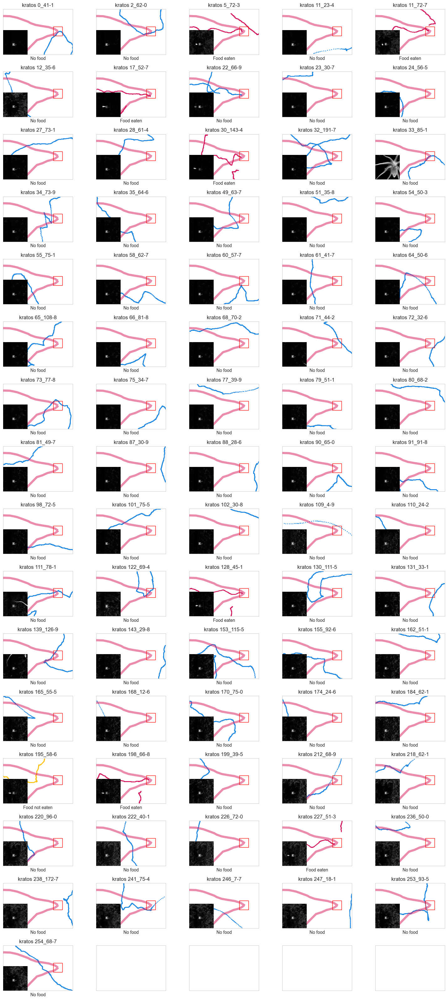

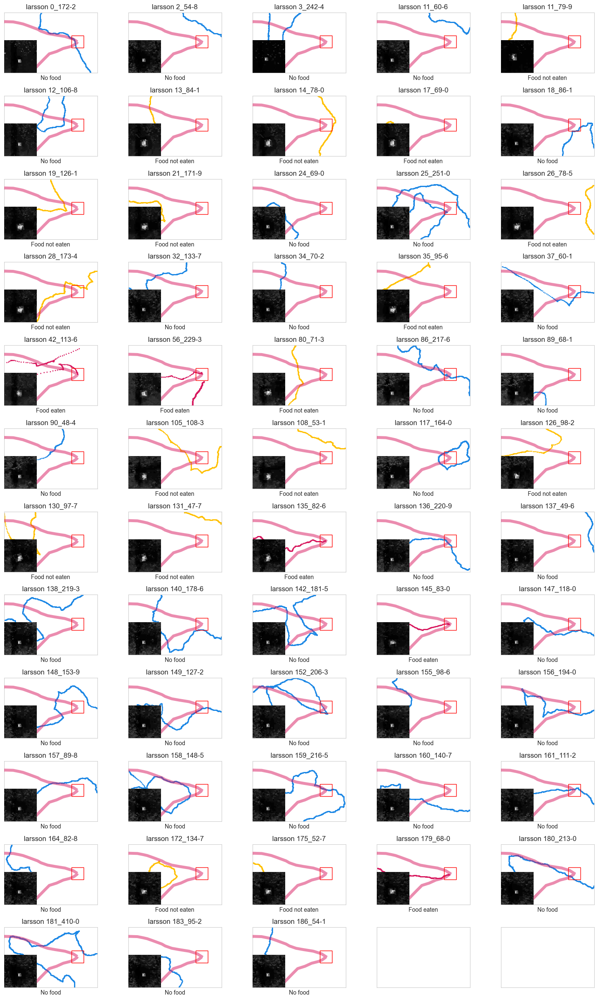

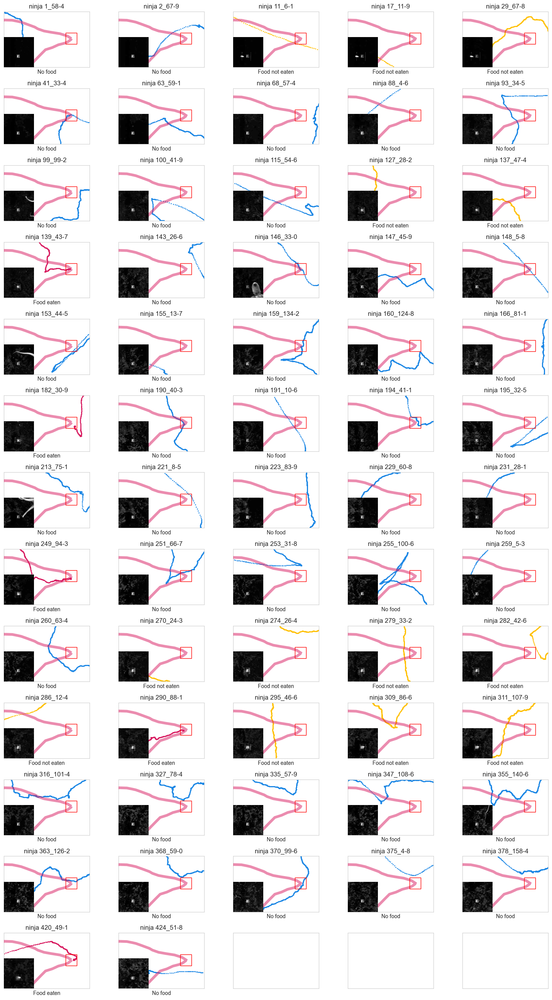

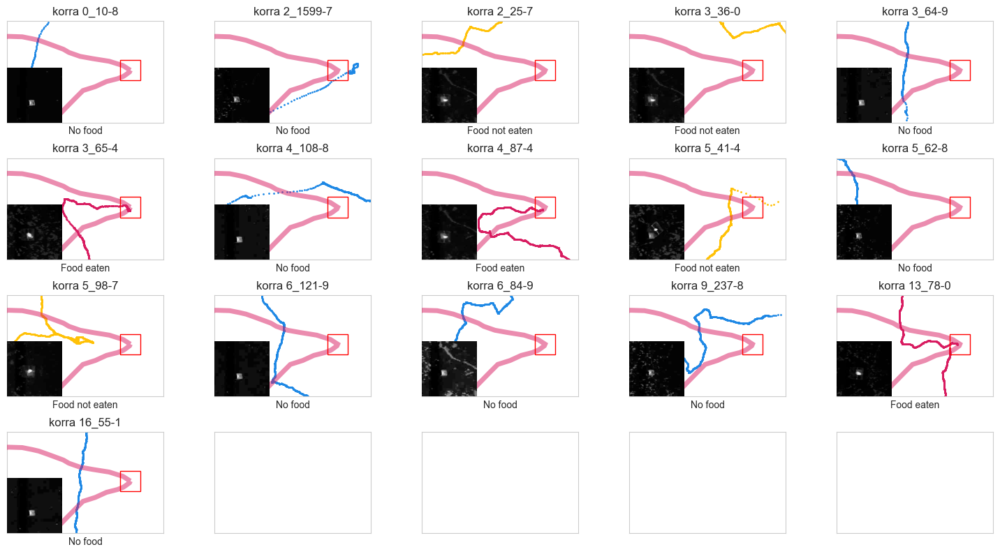

In [172]:
def get_sub_dir_n (sub_dir):
    return int(os.path.basename(sub_dir).split('_')[0])

# unique food codes: ['No food' 'Food eaten' 'Food not eaten']
condition_color_key = {'No food': '#1E88E5', 'Food eaten': '#D81B60', 'Food not eaten': '#FFC107'}

rect_width = 150

for animal in animals[:]:
    tmp = data[data['animal'] == animal]

    subdirs = tmp['subdir'].unique()
    subdirs = sorted(subdirs, key=get_sub_dir_n)
    nsubdirs = len(subdirs)

    ncols = 5
    nrows = int(np.ceil(nsubdirs/ncols))

    fig, axs = plt.subplots(nrows, ncols, figsize=(ncols*3, nrows*2))

    for i in range(0, nsubdirs):
        ax = axs.flatten()[i]
        subdir = subdirs[i]
        tmptmp = tmp[tmp['subdir'] == subdir]

        path_video = glob.glob(os.path.join(subdir, '*_ff.mp4'))[0]
        if os.path.exists(path_video) != True:
            print(f' {path_video} does not exist')
        ## grab the index at 10% of video length
        cap = cv2.VideoCapture(path_video)
        nframes = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        target_frame = int(nframes*0.1)

        cap.set(cv2.CAP_PROP_POS_FRAMES, target_frame)
        ret, frame = cap.read()
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        cap.release()

        frame = frame[int(food_location[1]-rect_width/2):int(food_location[1]+rect_width/2), int(food_location[0]-rect_width/2):int(food_location[0]+rect_width/2)]

        ax.imshow(frame, cmap='Greys_r', zorder=5, extent=[400, 800, 965, 565])

        mex = tmptmp['mex'].values[0]
        mey = tmptmp['mey'].values[0]

        poly = plt.Polygon(plume_vertices, facecolor='none', edgecolor='#D81B60', linewidth=5, alpha=0.5, zorder=3)
        ax.add_patch(poly)

        rect = plt.Rectangle((food_location[0]-rect_width/2, food_location[1]-rect_width/2), rect_width, rect_width, facecolor='none', edgecolor='red', linewidth=1, alpha=1, zorder=4)
        ax.add_patch(rect)

        color = condition_color_key[tmptmp['condition'].values[0]]
        ax.scatter(mex, mey, s=1, color=color, zorder=2)

        ax.set_xlabel(tmptmp['condition'].values[0])

        title = os.path.basename(os.path.dirname(subdir)) + ' ' + os.path.basename(subdir)
        ax.set_title(title)

    for ax in axs.flatten():
        ax.grid(color='white')
        ax.set_aspect('equal')
        ax.set_xlim(400, 1550)
        ax.set_ylim(965, 220)

        ax.set_xticks([])
        ax.set_yticks([])

    fig.tight_layout()

    plt.show(fig)
    plt.close(fig)
